In [1]:
# *****************************************************
# Talha Shahzad
# 21i-0540
# Applied Machine Learning
# Project
# *****************************************************

In [2]:
import os
import glob
import json
import random
import nltk
from itertools import chain
from nltk.corpus import stopwords, wordnet
from nltk.tokenize import word_tokenize
from PIL import Image
import torch
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
import torchvision.models as models
from transformers import BertTokenizer, BertModel
import kagglehub
import matplotlib.pyplot as plt
from wordcloud import WordCloud
from sklearn.feature_extraction.text import TfidfVectorizer
from torch.utils.tensorboard import SummaryWriter
from sklearn.metrics import roc_auc_score, precision_recall_fscore_support, confusion_matrix

In [3]:
# def mount_drive():
#     drive.mount('/content/drive')
# mount_drive()

# Download latest version
path = kagglehub.dataset_download("marafey/hateful-memes-dataset")
data_root = path + '/data'
print("Path to dataset files:", data_root)

Path to dataset files: /teamspace/studios/this_studio/.cache/kagglehub/datasets/marafey/hateful-memes-dataset/versions/1/data


In [4]:
%load_ext tensorboard
%tensorboard --logdir /logs

ERROR: Timed out waiting for TensorBoard to start. It may still be running as pid 6378.

In [5]:
nltk.download('punkt')
nltk.download('stopwords')
nltk.download('punkt')
nltk.download('punkt_tab')
nltk.download('stopwords')
nltk.download('wordnet')

[nltk_data] Downloading package punkt to
[nltk_data]     /teamspace/studios/this_studio/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     /teamspace/studios/this_studio/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to
[nltk_data]     /teamspace/studios/this_studio/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package punkt_tab to
[nltk_data]     /teamspace/studios/this_studio/nltk_data...
[nltk_data]   Package punkt_tab is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     /teamspace/studios/this_studio/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     /teamspace/studios/this_studio/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


True

In [6]:
def text_cleaner(text):
    words = word_tokenize(text.lower())
    stops = set(stopwords.words('english'))
    return ' '.join([w for w in words if w.isalpha() and w not in stops])

def synonym_replacement(text, n=2):
    words = word_tokenize(text)
    new_words = words.copy()
    random_word_list = list(set([w for w in words if wordnet.synsets(w)]))
    random.shuffle(random_word_list)
    num_replaced = 0
    for random_word in random_word_list:
        synonyms = wordnet.synsets(random_word)
        lemmas = set(chain.from_iterable([w.lemma_names() for w in synonyms]))
        lemmas.discard(random_word)
        if lemmas:
            new_words = [random.choice(list(lemmas)) if w == random_word else w for w in new_words]
            num_replaced += 1
        if num_replaced >= n:
            break
    return ' '.join(new_words)

In [7]:
class HatefulMemesDataset(Dataset):
    def __init__(self, root_dir, annotations_file, img_folder='img', max_length=128, transform=None, tokenizer=None, augment_text=False):
        # Load metadata
        self.data = []
        with open(os.path.join(root_dir, annotations_file), 'r') as f:
            for line in f:
                self.data.append(json.loads(line))
        self.img_dir = os.path.join(root_dir, img_folder)
        # Image transforms with normalization
        self.transform = transform or transforms.Compose([
            transforms.Resize((224, 224)),
            transforms.RandomRotation(15),
            transforms.RandomHorizontalFlip(),
            transforms.ToTensor(),
            transforms.Normalize(mean=[0.485,0.456,0.406], std=[0.229,0.224,0.225])
        ])
        self.tokenizer = tokenizer or BertTokenizer.from_pretrained('bert-base-uncased')
        self.max_length = max_length
        self.augment_text = augment_text

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        row = self.data[idx]
        # Image
        img_path = os.path.join(self.img_dir, os.path.basename(row['img']))
        image = Image.open(img_path).convert('RGB')
        image = self.transform(image)
        # Text cleaning
        text = text_cleaner(str(row.get('text', '')))
        if self.augment_text:
            text = synonym_replacement(text)
        # Tokenize
        encoding = self.tokenizer(
            text,
            padding='max_length',
            truncation=True,
            max_length=self.max_length,
            return_tensors='pt'
        )
        input_ids = encoding['input_ids'].squeeze(0)
        attention_mask = encoding['attention_mask'].squeeze(0)
        # Label
        label = torch.tensor(row['label'], dtype=torch.long) if 'label' in row else torch.tensor(-1)
        return {'image': image, 'input_ids': input_ids, 'attention_mask': attention_mask, 'label': label}

In [8]:
def create_transforms(image_size=224):
    train_transform = transforms.Compose([
        transforms.Resize((image_size, image_size)),
        transforms.RandomRotation(15),
        transforms.RandomHorizontalFlip(),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485,0.456,0.406], std=[0.229,0.224,0.225])
    ])
    val_transform = transforms.Compose([
        transforms.Resize((image_size, image_size)),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485,0.456,0.406], std=[0.229,0.224,0.225])
    ])
    return {'train': train_transform, 'val': val_transform}


In [9]:
def get_dataloaders(data_root, train_ann, val_ann, batch_size=32, num_workers=2, augment_text=False):
    transforms_dict = create_transforms()
    tokenizer = BertTokenizer.from_pretrained('bert-base-uncased')
    train_ds = HatefulMemesDataset(data_root, train_ann, transform=transforms_dict['train'], tokenizer=tokenizer, augment_text=augment_text)
    val_ds = HatefulMemesDataset(data_root, val_ann, transform=transforms_dict['val'], tokenizer=tokenizer)
    train_loader = DataLoader(train_ds, batch_size=batch_size, shuffle=True, num_workers=num_workers)
    val_loader = DataLoader(val_ds, batch_size=batch_size, shuffle=False, num_workers=num_workers)
    return train_loader, val_loader

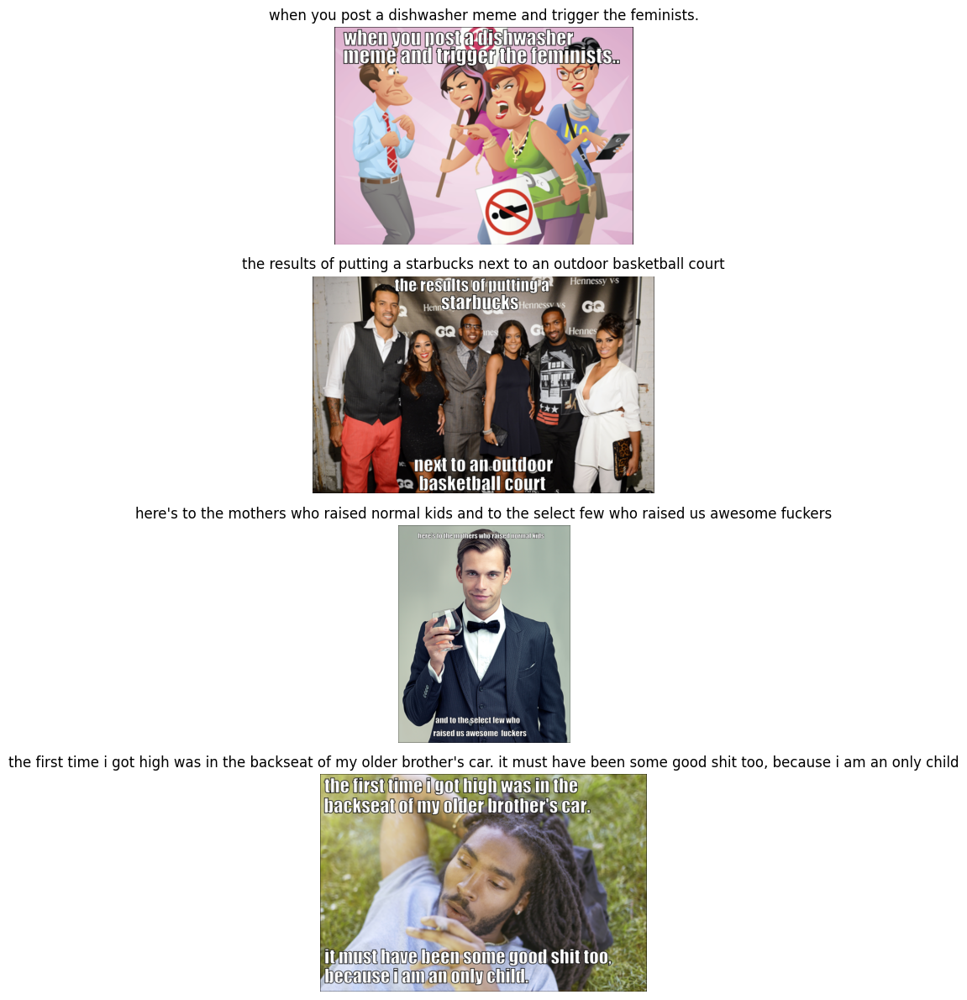

In [10]:
def visualize_samples(data_root, annotations_file, img_folder='img', num_samples=4):
    with open(os.path.join(data_root, annotations_file), 'r') as f:
        data = [json.loads(l) for l in f]
    samples = random.sample(data, num_samples)
    plt.figure(figsize=(12, 3*num_samples))
    for i, row in enumerate(samples):
        img = Image.open(os.path.join(data_root, img_folder, os.path.basename(row['img']))).convert('RGB')
        plt.subplot(num_samples, 1, i+1)
        plt.imshow(img)
        plt.title(row.get('text', ''))
        plt.axis('off')
    plt.tight_layout()
    plt.show()
visualize_samples(data_root, 'train.jsonl')

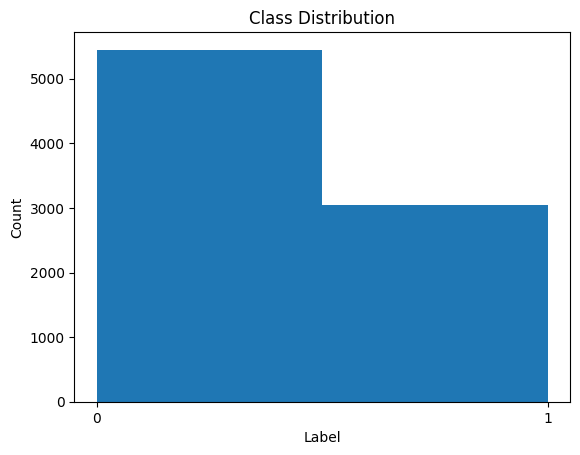

In [11]:
def plot_class_distribution(data_root, annotations_file):
    with open(os.path.join(data_root, annotations_file), 'r') as f:
        labels = [json.loads(l).get('label', -1) for l in f]
    plt.figure()
    plt.hist([l for l in labels if l>=0], bins=2)
    plt.xticks([0,1])
    plt.xlabel('Label')
    plt.ylabel('Count')
    plt.title('Class Distribution')
    plt.show()
plot_class_distribution(data_root, 'train.jsonl')

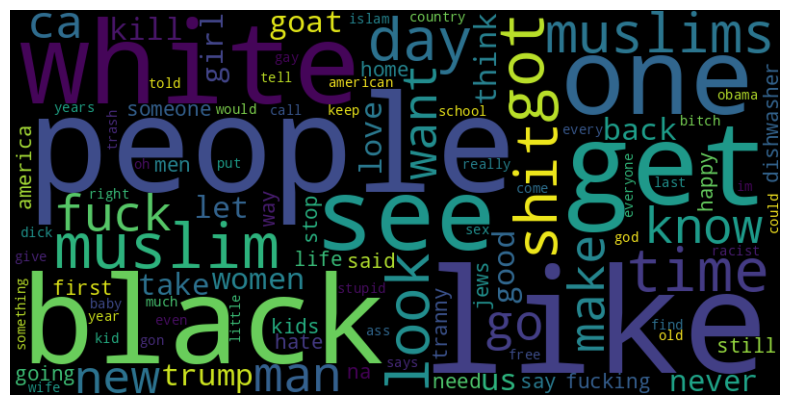

In [12]:
def plot_wordcloud(data_root, annotations_file):
    with open(os.path.join(data_root, annotations_file), 'r') as f:
        texts = [json.loads(l).get('text','') for l in f]
    cleaned = [text_cleaner(t) for t in texts]
    vec = TfidfVectorizer(max_features=100)
    tfidf = vec.fit_transform(cleaned)
    freqs = dict(zip(vec.get_feature_names_out(), tfidf.sum(axis=0).A1))
    wc = WordCloud(width=800, height=400).generate_from_frequencies(freqs)
    plt.figure(figsize=(10,5))
    plt.imshow(wc, interpolation='bilinear')
    plt.axis('off')
    plt.show()
plot_wordcloud(data_root, 'train.jsonl')

In [57]:
class LateFusionModel(torch.nn.Module):
    def __init__(self, image_model='resnet', text_model='bert', vocab_size=None, embed_dim=300, hidden_dim=512, dropout=0.5):
        super().__init__()
        # Image encoder
        if image_model=='resnet':
            base = models.resnet50(weights=models.ResNet50_Weights.IMAGENET1K_V1)
            base.fc = torch.nn.Identity()
            self.img_enc = base
            img_dim = 2048
        else:
            self.img_enc = torch.nn.Sequential(
                torch.nn.Conv2d(3,32,3,padding=1), torch.nn.ReLU(), torch.nn.MaxPool2d(2),
                torch.nn.Conv2d(32,64,3,padding=1), torch.nn.ReLU(), torch.nn.MaxPool2d(2), torch.nn.Flatten()
            )
            img_dim = 56*56*64
        # Text encoder
        if text_model=='bert':
            self.txt_enc = BertModel.from_pretrained('bert-base-uncased')
            txt_dim = 768
            self.embedding = None
        else:
            self.embedding = torch.nn.Embedding(vocab_size, embed_dim)
            self.txt_enc = torch.nn.LSTM(input_size=embed_dim, hidden_size=256, num_layers=1, bidirectional=True, batch_first=True)
            txt_dim = 512
        # Classifier
        self.classifier = torch.nn.Sequential(
            torch.nn.Linear(img_dim+txt_dim, hidden_dim), torch.nn.ReLU(), torch.nn.Dropout(dropout), torch.nn.Linear(hidden_dim,2)
        )

    def forward(self, images, input_ids=None, attention_mask=None):
        img_feat = self.img_enc(images)
        if hasattr(self, 'embedding') and self.embedding is not None:
            x = self.embedding(input_ids)
            _, (h, _) = self.txt_enc(x)
            txt_feat = torch.cat([h[-2], h[-1]], dim=1)
        else:
            out = self.txt_enc(input_ids=input_ids, attention_mask=attention_mask)
            txt_feat = out.pooler_output
        fused = torch.cat([img_feat, txt_feat], dim=1)
        return self.classifier(fused)

In [74]:
class EarlyFusionModel(LateFusionModel):
    """
    Early Fusion model inherits LateFusionModel, reusing same init and forward.
    """
    pass

# Training & logging
def train(model, train_loader, val_loader, epochs, lr, log_dir='/content/drive/MyDrive/logs'):
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    model.to(device)
    optimizer = torch.optim.Adam(model.parameters(), lr=lr)
    criterion = torch.nn.CrossEntropyLoss()
    os.makedirs(log_dir, exist_ok=True)
    writer = SummaryWriter(log_dir)
    global_step = 0
    for epoch in range(1, epochs+1):
        model.train()
        total_loss = 0
        print(f"Starting epoch {epoch}/{epochs}")
        for batch_idx, batch in enumerate(train_loader, 1):
            imgs = batch['image'].to(device)
            ids = batch['input_ids'].to(device)
            masks = batch['attention_mask'].to(device)
            labels = batch['label'].to(device)
            optimizer.zero_grad()
            outputs = model(imgs, input_ids=ids, attention_mask=masks)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()
            total_loss += loss.item()
            writer.add_scalar('Train/Batch_Loss', loss.item(), global_step)
            if batch_idx % 10 == 0 or batch_idx == len(train_loader):
                print(f"Epoch {epoch}, Batch {batch_idx}/{len(train_loader)}, Loss: {loss.item():.4f}")
            global_step += 1
        avg_loss = total_loss / len(train_loader)
        writer.add_scalar('Train/Epoch_Loss', avg_loss, epoch)
        print(f"Epoch {epoch} completed. Avg Loss: {avg_loss:.4f}")
    writer.close()

In [59]:
def get_latest_checkpoint(dir_path):
    files = glob.glob(os.path.join(dir_path, 'model_epoch_*.pt'))
    if not files:
        return None
    return max(files, key=lambda x: int(x.split('_')[-1].split('.pt')[0]))

In [77]:
def train(model, train_loader, val_loader, epochs, lr, log_dir='logs'):
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    model.to(device)
    optimizer = torch.optim.Adam(model.parameters(), lr=lr)
    criterion = torch.nn.CrossEntropyLoss()
    os.makedirs(log_dir, exist_ok=True)
    writer = SummaryWriter(log_dir)
    global_step = 0
    for epoch in range(1, epochs+1):
        model.train()
        total_loss = 0
        print(f"Starting epoch {epoch}/{epochs}")
        for batch_idx, batch in enumerate(train_loader, 1):
            imgs = batch['image'].to(device)
            ids = batch['input_ids'].to(device)
            masks = batch['attention_mask'].to(device)
            labels = batch['label'].to(device)
            optimizer.zero_grad()
            outputs = model(imgs, input_ids=ids, attention_mask=masks)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()
            total_loss += loss.item()
            writer.add_scalar('Train/Batch_Loss', loss.item(), global_step)
            if batch_idx % 10 == 0 or batch_idx == len(train_loader):
                print(f"Epoch {epoch}, Batch {batch_idx}/{len(train_loader)}, Loss: {loss.item():.4f}")
            global_step += 1
        avg_loss = total_loss / len(train_loader)
        writer.add_scalar('Train/Epoch_Loss', avg_loss, epoch)
        print(f"Epoch {epoch} completed. Avg Loss: {avg_loss:.4f}")
    writer.close()

In [61]:
# Variant helpers
def train_variant(image_model, text_model, data_dir, train_file, val_file,
                  epochs=5, lr=1e-4, batch_size=16, embed_dim=300):
    # prepare dataloaders
    train_loader, val_loader = get_dataloaders(
        data_dir, train_file, val_file,
        batch_size=batch_size, augment_text=True
    )

    # only set vocab_size for LSTM
    tok = BertTokenizer.from_pretrained('bert-base-uncased')
    vocab_size = tok.vocab_size if text_model == 'lstm' else None

    # build and train
    model = LateFusionModel(
        image_model=image_model,
        text_model=text_model,
        vocab_size=vocab_size,
        embed_dim=embed_dim
    )
    train(model, train_loader, val_loader, epochs, lr)


def train_early_fusion(data_dir, train_file, val_file, image_model, text_model, epochs=5, lr=1e-4, batch_size=16, embed_dim=300):
    train_loader, val_loader = get_dataloaders(data_dir, train_file, val_file, batch_size=batch_size, augment_text=True)
    tok = BertTokenizer.from_pretrained('bert-base-uncased')
    vocab_size = tok.vocab_size if text_model == 'lstm' else None
    model = EarlyFusionModel(image_model=image_model, text_model=text_model, vocab_size=vocab_size, embed_dim=embed_dim)
    train(model, train_loader, val_loader, epochs, lr)

In [62]:
# Checkpoint utilities

def get_latest_checkpoint(dir_path):
    files = glob.glob(os.path.join(dir_path, 'model_epoch_*.pt'))
    if not files:
        return None
    return max(files, key=lambda x: int(x.split('_')[-1].split('.pt')[0]))

In [63]:
def evaluate(model, data_loader, device):
    model.eval()
    all_labels, all_preds, all_probs = [], [], []
    with torch.no_grad():
        for batch in data_loader:
            images = batch['image'].to(device)
            ids = batch['input_ids'].to(device)
            masks = batch['attention_mask'].to(device)
            labels = batch['label'].to(device)
            outputs = model(images, input_ids=ids, attention_mask=masks)
            probs = torch.softmax(outputs, dim=1)[:,1]
            preds = torch.argmax(outputs, dim=1)
            all_labels.extend(labels.cpu().tolist())
            all_preds.extend(preds.cpu().tolist())
            all_probs.extend(probs.cpu().tolist())
    auc = roc_auc_score(all_labels, all_probs)
    precision, recall, f1, _ = precision_recall_fscore_support(all_labels, all_preds, average='binary')
    cm = confusion_matrix(all_labels, all_preds)
    return {'auc': auc, 'precision': precision, 'recall': recall, 'f1': f1, 'confusion_matrix': cm, 'probs': all_probs, 'preds': all_preds, 'labels': all_labels}

In [64]:
def plot_confusion(cm):
    plt.figure(figsize=(4,4))
    plt.imshow(cm, interpolation='nearest', cmap=plt.cm.Blues)
    plt.title('Confusion Matrix')
    plt.colorbar()
    tick_marks = [0,1]
    plt.xticks(tick_marks, ['Non-hateful','Hateful'])
    plt.yticks(tick_marks, ['Non-hateful','Hateful'])
    plt.ylabel('True label')
    plt.xlabel('Predicted label')
    plt.tight_layout()
    plt.show()

def plot_roc(labels, probs):
    from sklearn.metrics import roc_curve
    fpr, tpr, _ = roc_curve(labels, probs)
    plt.figure()
    plt.plot(fpr, tpr)
    plt.plot([0,1], [0,1], 'k--')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('ROC Curve')
    plt.show()

In [66]:
def analyze_classification(data_loader, labels, preds, ds, num_samples=3):
    import random
    import matplotlib.pyplot as plt
    print("Correctly Classified Samples:")
    correct_idx = [i for i,(l,p) in enumerate(zip(labels, preds)) if l==p]
    for i in random.sample(correct_idx, min(len(correct_idx), num_samples)):
        row = ds.data[i]
        img = Image.open(os.path.join(ds.img_dir, os.path.basename(row['img']))).convert('RGB')
        plt.imshow(img);
        plt.title(f"True: {labels[i]}, Pred: {preds[i]} {text_cleaner(row.get('text',''))}"); plt.axis('off'); plt.show()
    print("Incorrectly Classified Samples:")
    incorrect_idx = [i for i,(l,p) in enumerate(zip(labels, preds)) if l!=p]
    for i in random.sample(incorrect_idx, min(len(incorrect_idx), num_samples)):
        row = ds.data[i]
        img = Image.open(os.path.join(ds.img_dir, os.path.basename(row['img']))).convert('RGB')
        plt.imshow(img); 
        plt.title(f"True: {labels[i]}, Pred: {preds[i]} {text_cleaner(row.get('text',''))}"); plt.axis('off'); plt.show()


In [55]:
# def main():
#     # Prepare data loaders
#     train_loader, val_loader = get_dataloaders(
#         data_root, 'train.jsonl', 'dev.jsonl',
#         batch_size=32, num_workers=2, augment_text=True
#     )
#     # Sanity check
#     sample = next(iter(train_loader))
#     print('Batch shapes:')
#     print('  Images:', sample['image'].shape)
#     print('  Input IDs:', sample['input_ids'].shape)
#     print('  Attention mask:', sample['attention_mask'].shape)
#     print('  Labels:', sample['label'].shape)

#     device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
#     results = {}
#     # Late Fusion variants
#     for img_mod, txt_mod in [('resnet','bert'), ('resnet','lstm'), ('cnn','bert'), ('cnn','lstm')]:
#         print(f"\n=== Late Fusion: {img_mod.upper()} + {txt_mod.upper()} ===")
#         train_variant(img_mod, txt_mod, data_root, 'train.jsonl', 'dev.jsonl')
#         model = LateFusionModel(image_model=img_mod, text_model=txt_mod)
#         model.to(device)
#         res = evaluate(model, val_loader, device)
#         results[f'Late_{img_mod}_{txt_mod}'] = res
#         plot_confusion(res['confusion_matrix'])
#         plot_roc(res['labels'], res['probs'])
#     # Early Fusion variants
#     for img_mod, txt_mod in [('resnet','bert'), ('resnet','lstm'), ('cnn','bert'), ('cnn','lstm')]:
#         print(f"\n=== Early Fusion: {img_mod.upper()} + {txt_mod.upper()} ===")
#         train_early_fusion(data_root, 'train.jsonl', 'dev.jsonl', img_mod, txt_mod)
#         model = EarlyFusionModel(image_model=img_mod, text_model=txt_mod)
#         model.to(device)
#         res = evaluate(model, val_loader, device)
#         results[f'Early_{img_mod}_{txt_mod}'] = res
#         plot_confusion(res['confusion_matrix'])
#         plot_roc(res['labels'], res['probs'])
#     # Summary
#     print("\n=== Summary ===")
#     for k,v in results.items():
#         print(f"{k}: AUROC={v['auc']:.4f}, Precision={v['precision']:.4f}, Recall={v['recall']:.4f}, F1={v['f1']:.4f}")

# if __name__=='__main__':
#     main()


In [67]:
# Prepare data loaders
train_loader, val_loader = get_dataloaders(
    data_root, 'train.jsonl', 'dev.jsonl',
    batch_size=32, num_workers=2, augment_text=True
)
# Sanity check
sample = next(iter(train_loader))
print('Batch shapes:')
print('  Images:', sample['image'].shape)
print('  Input IDs:', sample['input_ids'].shape)
print('  Attention mask:', sample['attention_mask'].shape)
print('  Labels:', sample['label'].shape)

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

Batch shapes:
  Images: torch.Size([32, 3, 224, 224])
  Input IDs: torch.Size([32, 128])
  Attention mask: torch.Size([32, 128])
  Labels: torch.Size([32])


Starting epoch 1/5
Epoch 1, Batch 10/266, Loss: 0.7797
Epoch 1, Batch 20/266, Loss: 0.7057
Epoch 1, Batch 30/266, Loss: 0.6673
Epoch 1, Batch 40/266, Loss: 0.6606
Epoch 1, Batch 50/266, Loss: 0.5363
Epoch 1, Batch 60/266, Loss: 0.6938
Epoch 1, Batch 70/266, Loss: 0.6293
Epoch 1, Batch 80/266, Loss: 0.6657
Epoch 1, Batch 90/266, Loss: 0.5971
Epoch 1, Batch 100/266, Loss: 0.6914
Epoch 1, Batch 110/266, Loss: 0.6396
Epoch 1, Batch 120/266, Loss: 0.7411
Epoch 1, Batch 130/266, Loss: 0.6906
Epoch 1, Batch 140/266, Loss: 0.5936
Epoch 1, Batch 150/266, Loss: 0.6392
Epoch 1, Batch 160/266, Loss: 0.6226
Epoch 1, Batch 170/266, Loss: 0.5693
Epoch 1, Batch 180/266, Loss: 0.5731
Epoch 1, Batch 190/266, Loss: 0.7173
Epoch 1, Batch 200/266, Loss: 0.6415
Epoch 1, Batch 210/266, Loss: 0.6423
Epoch 1, Batch 220/266, Loss: 0.6727
Epoch 1, Batch 230/266, Loss: 0.7299
Epoch 1, Batch 240/266, Loss: 0.5451
Epoch 1, Batch 250/266, Loss: 0.6469
Epoch 1, Batch 260/266, Loss: 0.5874
Epoch 1, Batch 266/266, Loss

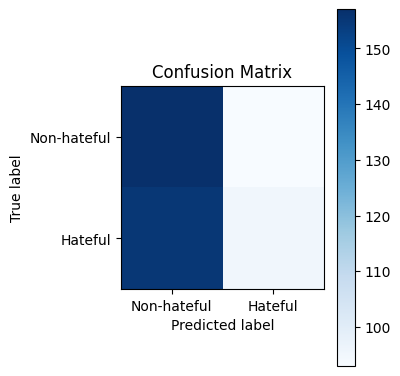

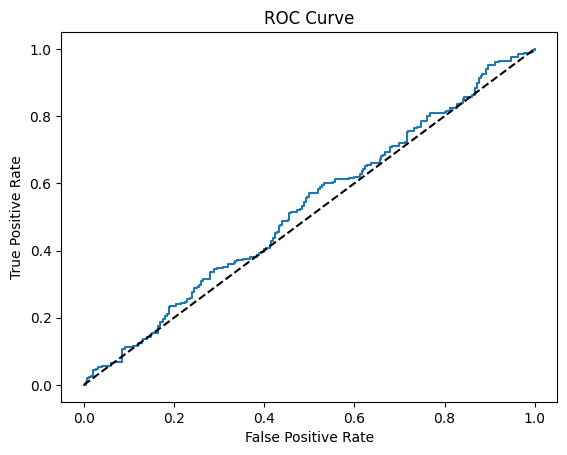

Correctly Classified Samples:


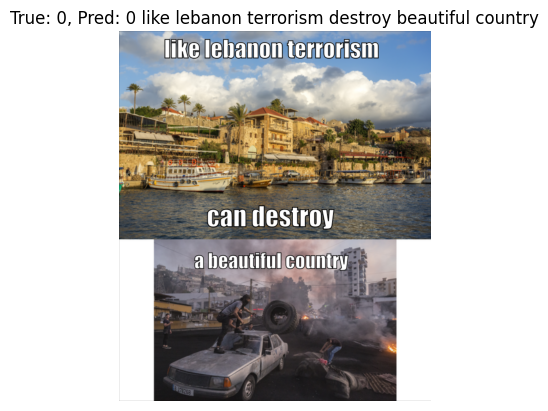

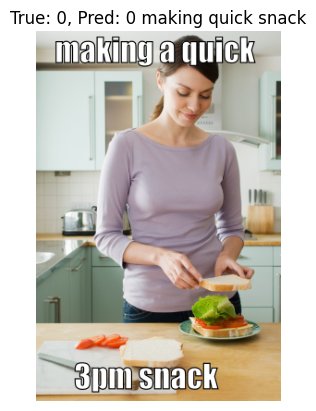

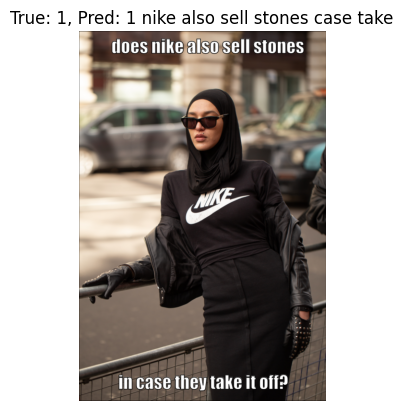

Incorrectly Classified Samples:


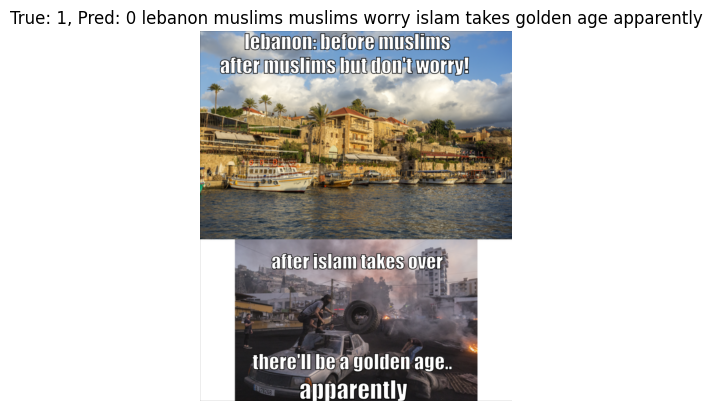

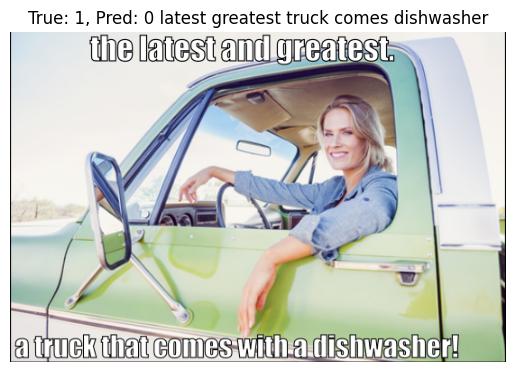

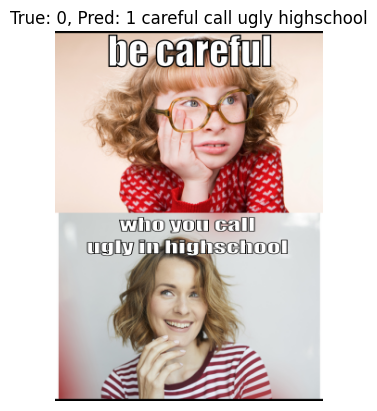

In [69]:
# 1) ResNet + BERT (Late Fusion)
train_variant('resnet', 'bert', data_root, 'train.jsonl', 'dev.jsonl', epochs=5, lr=1e-4, batch_size=32)
model_rb = LateFusionModel(image_model='resnet', text_model='bert', vocab_size=BertTokenizer.from_pretrained('bert-base-uncased').vocab_size)
model_rb.to(device)
res_rb = evaluate(model_rb, val_loader, device)
print(f"ResNet+BERT Late Fusion -> AUROC: {res_rb['auc']:.4f}, Precision: {res_rb['precision']:.4f}, Recall: {res_rb['recall']:.4f}, F1: {res_rb['f1']:.4f}")
plot_confusion(res_rb['confusion_matrix'])
plot_roc(res_rb['labels'], res_rb['probs'])
analyze_classification(val_loader, res_rb['labels'], res_rb['preds'], val_loader.dataset)


Starting epoch 1/5
Epoch 1, Batch 10/266, Loss: 0.6931
Epoch 1, Batch 20/266, Loss: 0.7051
Epoch 1, Batch 30/266, Loss: 0.6833
Epoch 1, Batch 40/266, Loss: 0.5819
Epoch 1, Batch 50/266, Loss: 0.6821
Epoch 1, Batch 60/266, Loss: 0.6591
Epoch 1, Batch 70/266, Loss: 0.6756
Epoch 1, Batch 80/266, Loss: 0.6235
Epoch 1, Batch 90/266, Loss: 0.5444
Epoch 1, Batch 100/266, Loss: 0.7516
Epoch 1, Batch 110/266, Loss: 0.5868
Epoch 1, Batch 120/266, Loss: 0.5969
Epoch 1, Batch 130/266, Loss: 0.6386
Epoch 1, Batch 140/266, Loss: 0.6050
Epoch 1, Batch 150/266, Loss: 0.6163
Epoch 1, Batch 160/266, Loss: 0.5619
Epoch 1, Batch 170/266, Loss: 0.5587
Epoch 1, Batch 180/266, Loss: 0.6360
Epoch 1, Batch 190/266, Loss: 0.6621
Epoch 1, Batch 200/266, Loss: 0.7430
Epoch 1, Batch 210/266, Loss: 0.6027
Epoch 1, Batch 220/266, Loss: 0.5651
Epoch 1, Batch 230/266, Loss: 0.5403
Epoch 1, Batch 240/266, Loss: 0.5918
Epoch 1, Batch 250/266, Loss: 0.7464
Epoch 1, Batch 260/266, Loss: 0.7293
Epoch 1, Batch 266/266, Loss

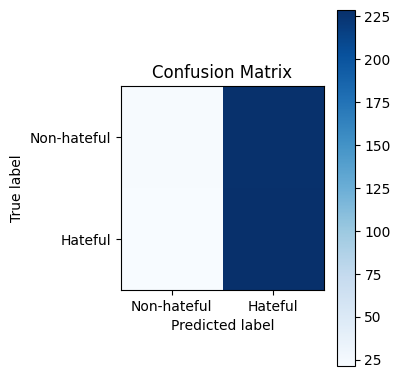

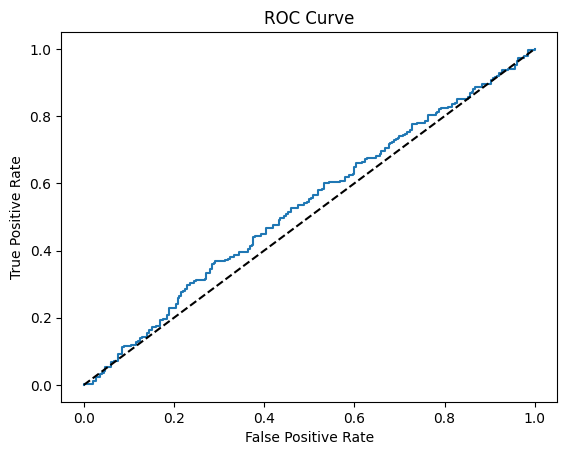

Correctly Classified Samples:


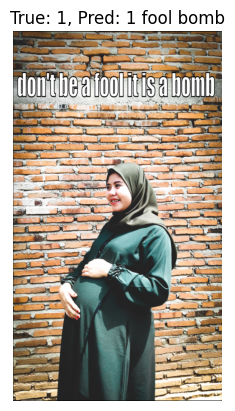

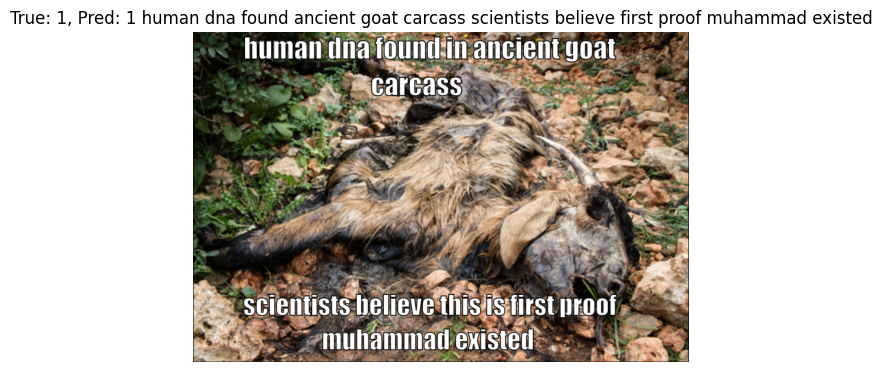

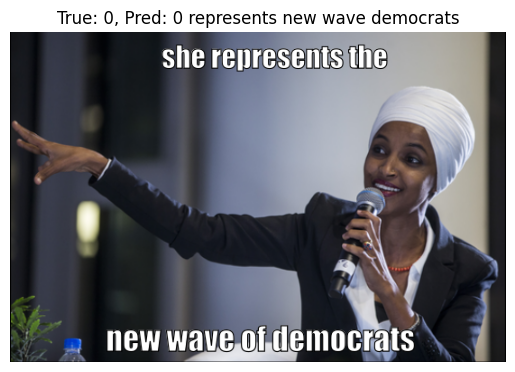

Incorrectly Classified Samples:


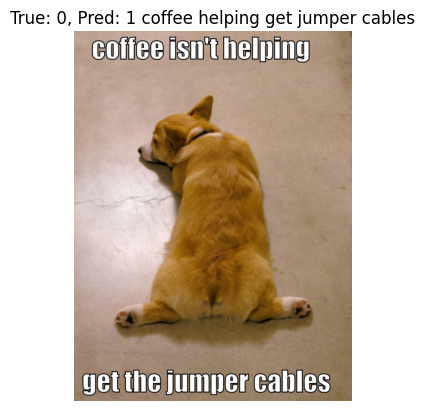

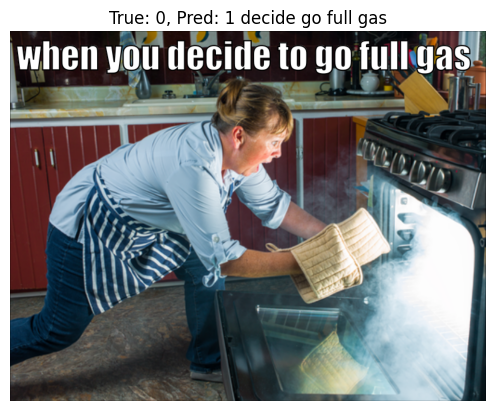

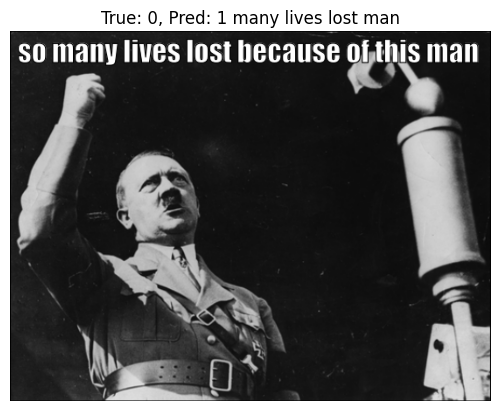

In [70]:
# 2) ResNet + LSTM (Late Fusion)
train_variant('resnet', 'lstm', data_root, 'train.jsonl', 'dev.jsonl', epochs=5, lr=1e-4, batch_size=32)
model_rl = LateFusionModel(image_model='resnet', text_model='lstm', vocab_size=BertTokenizer.from_pretrained('bert-base-uncased').vocab_size)
model_rl.to(device)
res_rl = evaluate(model_rl, val_loader, device)
print(f"ResNet+LSTM Late Fusion -> AUROC: {res_rl['auc']:.4f}, Precision: {res_rl['precision']:.4f}, Recall: {res_rl['recall']:.4f}, F1: {res_rl['f1']:.4f}")
plot_confusion(res_rl['confusion_matrix'])
plot_roc(res_rl['labels'], res_rl['probs'])
analyze_classification(val_loader, res_rl['labels'], res_rl['preds'], val_loader.dataset)

Starting epoch 1/5
Epoch 1, Batch 10/266, Loss: 1.4681
Epoch 1, Batch 20/266, Loss: 1.2971
Epoch 1, Batch 30/266, Loss: 0.7918
Epoch 1, Batch 40/266, Loss: 0.7129
Epoch 1, Batch 50/266, Loss: 0.6712
Epoch 1, Batch 60/266, Loss: 0.7077
Epoch 1, Batch 70/266, Loss: 0.6619
Epoch 1, Batch 80/266, Loss: 0.6338
Epoch 1, Batch 90/266, Loss: 0.7057
Epoch 1, Batch 100/266, Loss: 0.6679
Epoch 1, Batch 110/266, Loss: 0.6321
Epoch 1, Batch 120/266, Loss: 0.6758
Epoch 1, Batch 130/266, Loss: 0.6096
Epoch 1, Batch 140/266, Loss: 0.4884
Epoch 1, Batch 150/266, Loss: 0.6350
Epoch 1, Batch 160/266, Loss: 0.7353
Epoch 1, Batch 170/266, Loss: 0.6717
Epoch 1, Batch 180/266, Loss: 0.6904
Epoch 1, Batch 190/266, Loss: 0.6759
Epoch 1, Batch 200/266, Loss: 0.7147
Epoch 1, Batch 210/266, Loss: 0.6784
Epoch 1, Batch 220/266, Loss: 0.6380
Epoch 1, Batch 230/266, Loss: 0.5890
Epoch 1, Batch 240/266, Loss: 0.6140
Epoch 1, Batch 250/266, Loss: 0.7341
Epoch 1, Batch 260/266, Loss: 0.5850
Epoch 1, Batch 266/266, Loss

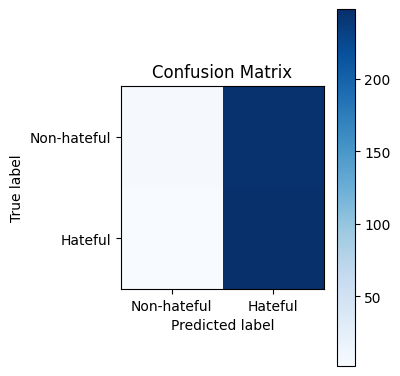

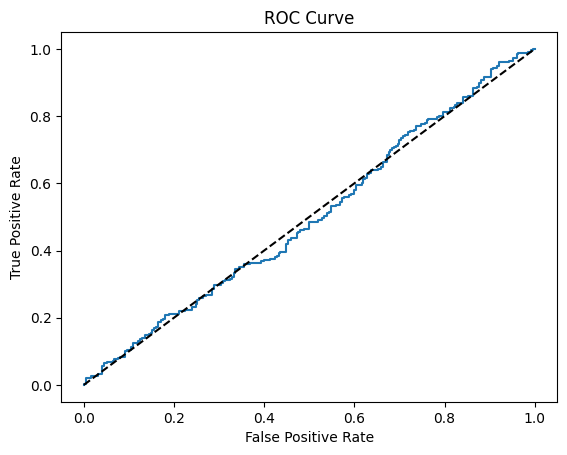

Correctly Classified Samples:


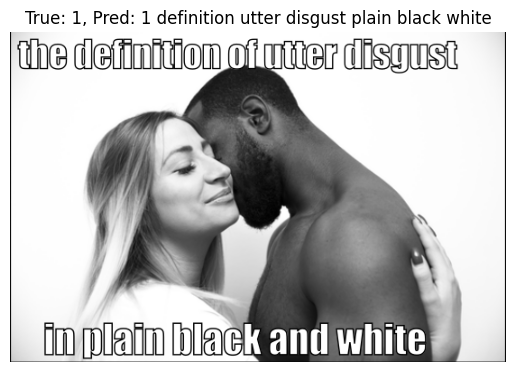

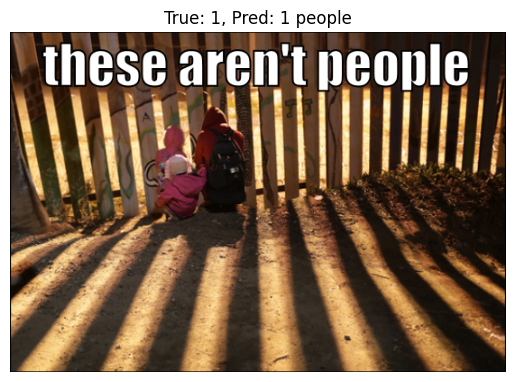

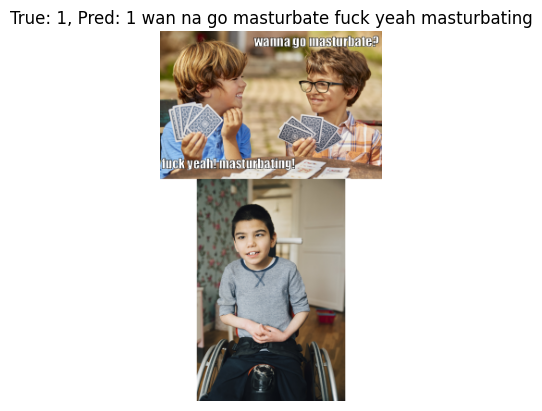

Incorrectly Classified Samples:


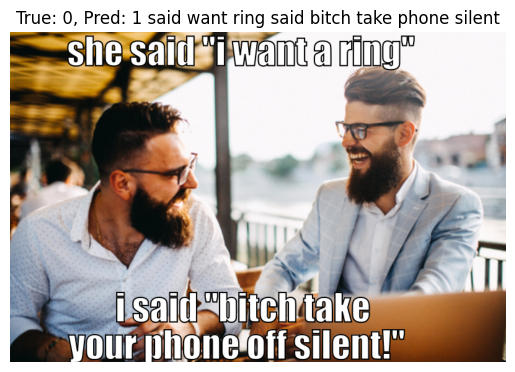

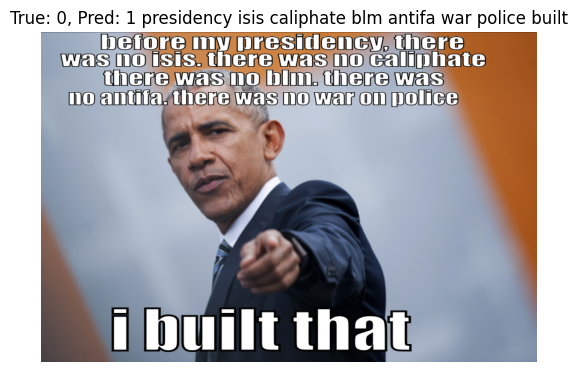

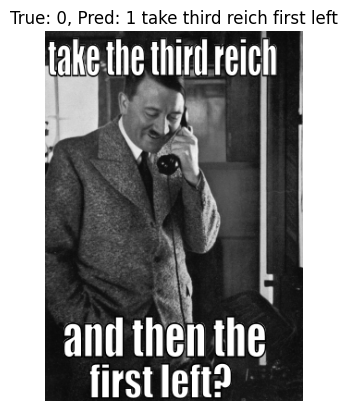

In [71]:

# 3) CNN + BERT (Late Fusion)
train_variant('cnn', 'bert', data_root, 'train.jsonl', 'dev.jsonl', epochs=5, lr=1e-4, batch_size=32)
model_cb = LateFusionModel(image_model='cnn', text_model='bert', vocab_size=BertTokenizer.from_pretrained('bert-base-uncased').vocab_size)
model_cb.to(device)
res_cb = evaluate(model_cb, val_loader, device)
print(f"CNN+BERT Late Fusion -> AUROC: {res_cb['auc']:.4f}, Precision: {res_cb['precision']:.4f}, Recall: {res_cb['recall']:.4f}, F1: {res_cb['f1']:.4f}")
plot_confusion(res_cb['confusion_matrix'])
plot_roc(res_cb['labels'], res_cb['probs'])
analyze_classification(val_loader, res_cb['labels'], res_cb['preds'], val_loader.dataset)

Starting epoch 1/5
Epoch 1, Batch 10/266, Loss: 1.4167
Epoch 1, Batch 20/266, Loss: 0.7102
Epoch 1, Batch 30/266, Loss: 0.7519
Epoch 1, Batch 40/266, Loss: 0.6000
Epoch 1, Batch 50/266, Loss: 0.7006
Epoch 1, Batch 60/266, Loss: 0.6715
Epoch 1, Batch 70/266, Loss: 0.5794
Epoch 1, Batch 80/266, Loss: 0.6314
Epoch 1, Batch 90/266, Loss: 0.6788
Epoch 1, Batch 100/266, Loss: 0.6773
Epoch 1, Batch 110/266, Loss: 0.6676
Epoch 1, Batch 120/266, Loss: 0.6154
Epoch 1, Batch 130/266, Loss: 0.7671
Epoch 1, Batch 140/266, Loss: 0.7011
Epoch 1, Batch 150/266, Loss: 0.7548
Epoch 1, Batch 160/266, Loss: 0.6246
Epoch 1, Batch 170/266, Loss: 0.6609
Epoch 1, Batch 180/266, Loss: 0.6699
Epoch 1, Batch 190/266, Loss: 0.6656
Epoch 1, Batch 200/266, Loss: 0.6092
Epoch 1, Batch 210/266, Loss: 0.6759
Epoch 1, Batch 220/266, Loss: 0.6834
Epoch 1, Batch 230/266, Loss: 0.6119
Epoch 1, Batch 240/266, Loss: 0.6098
Epoch 1, Batch 250/266, Loss: 0.6336
Epoch 1, Batch 260/266, Loss: 0.6978
Epoch 1, Batch 266/266, Loss

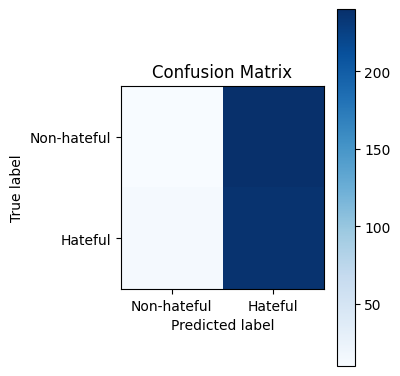

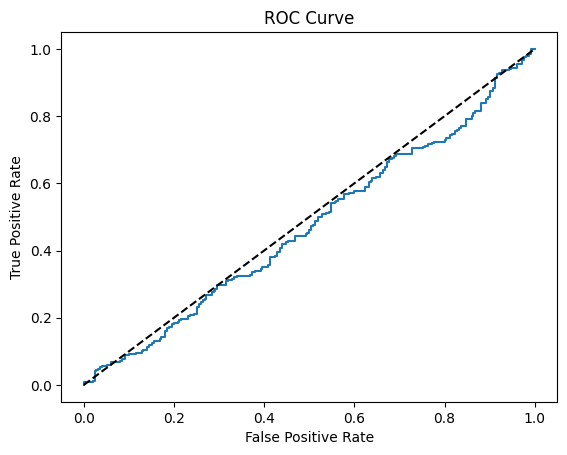

Correctly Classified Samples:


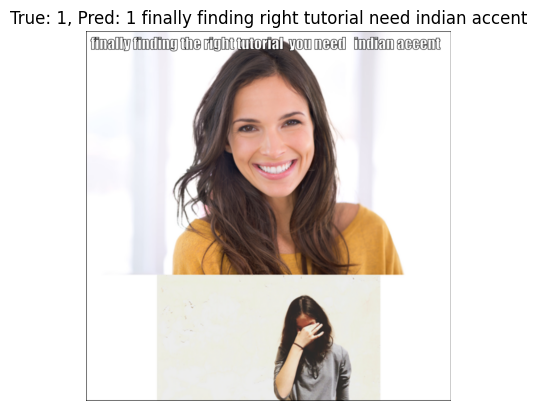

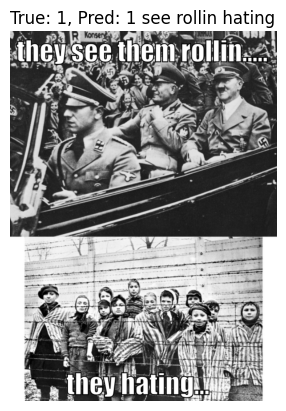

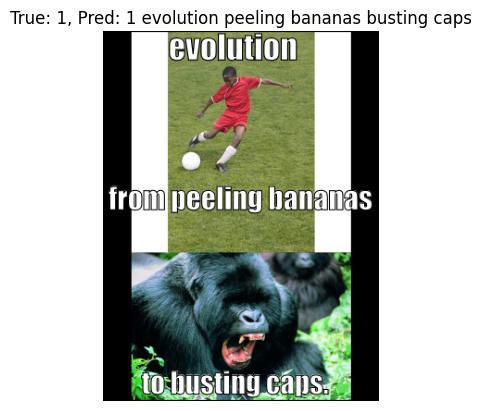

Incorrectly Classified Samples:


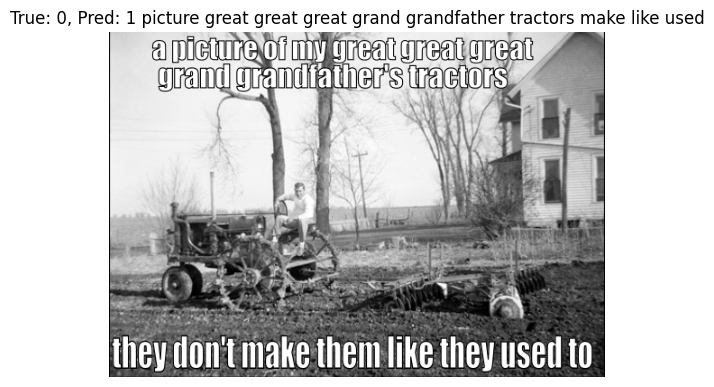

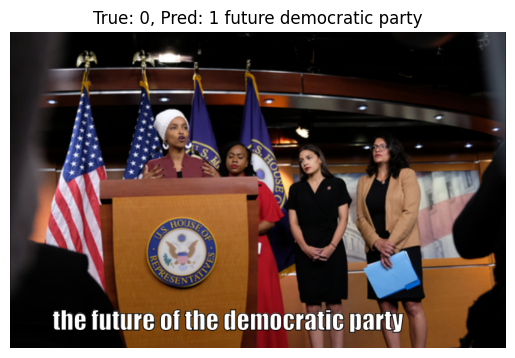

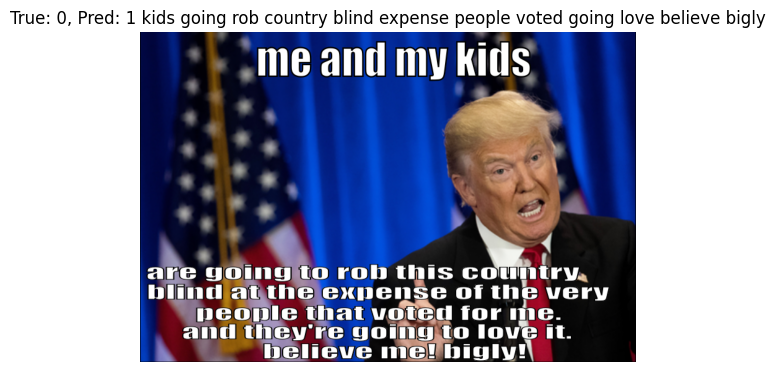

In [72]:
# 4) CNN + LSTM (Late Fusion)
train_variant('cnn', 'lstm', data_root, 'train.jsonl', 'dev.jsonl', epochs=5, lr=1e-4, batch_size=32)
model_cl = LateFusionModel(image_model='cnn', text_model='lstm', vocab_size=BertTokenizer.from_pretrained('bert-base-uncased').vocab_size)
model_cl.to(device)
res_cl = evaluate(model_cl, val_loader, device)
print(f"CNN+LSTM Late Fusion -> AUROC: {res_cl['auc']:.4f}, Precision: {res_cl['precision']:.4f}, Recall: {res_cl['recall']:.4f}, F1: {res_cl['f1']:.4f}")
plot_confusion(res_cl['confusion_matrix'])
plot_roc(res_cl['labels'], res_cl['probs'])
analyze_classification(val_loader, res_cl['labels'], res_cl['preds'], val_loader.dataset)


Starting epoch 1/5
Epoch 1, Batch 10/266, Loss: 0.6145
Epoch 1, Batch 20/266, Loss: 0.7001
Epoch 1, Batch 30/266, Loss: 0.5993
Epoch 1, Batch 40/266, Loss: 0.5908
Epoch 1, Batch 50/266, Loss: 0.6505
Epoch 1, Batch 60/266, Loss: 0.6525
Epoch 1, Batch 70/266, Loss: 0.6352
Epoch 1, Batch 80/266, Loss: 0.7608
Epoch 1, Batch 90/266, Loss: 0.5309
Epoch 1, Batch 100/266, Loss: 0.5980
Epoch 1, Batch 110/266, Loss: 0.6814
Epoch 1, Batch 120/266, Loss: 0.6515
Epoch 1, Batch 130/266, Loss: 0.6376
Epoch 1, Batch 140/266, Loss: 0.6237
Epoch 1, Batch 150/266, Loss: 0.6656
Epoch 1, Batch 160/266, Loss: 0.6830
Epoch 1, Batch 170/266, Loss: 0.6669
Epoch 1, Batch 180/266, Loss: 0.4950
Epoch 1, Batch 190/266, Loss: 0.7135
Epoch 1, Batch 200/266, Loss: 0.7360
Epoch 1, Batch 210/266, Loss: 0.5925
Epoch 1, Batch 220/266, Loss: 0.5846
Epoch 1, Batch 230/266, Loss: 0.6617
Epoch 1, Batch 240/266, Loss: 0.6815
Epoch 1, Batch 250/266, Loss: 0.5878
Epoch 1, Batch 260/266, Loss: 0.6521
Epoch 1, Batch 266/266, Loss

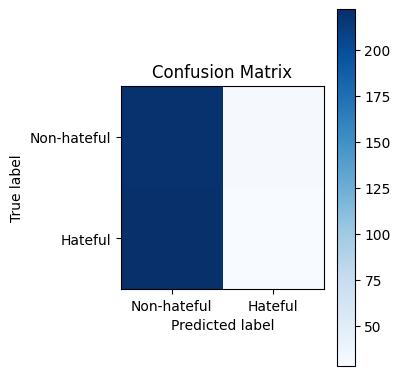

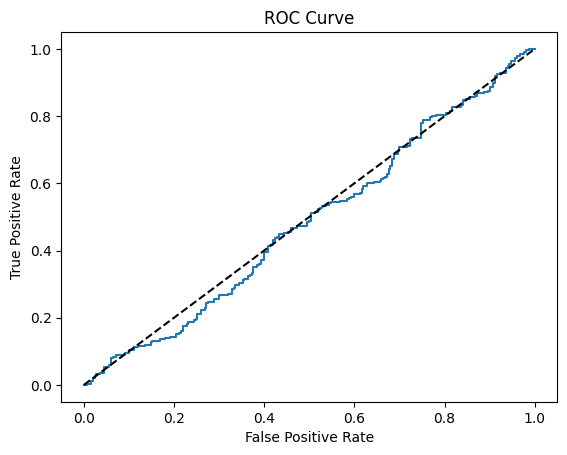

Correctly Classified Samples:


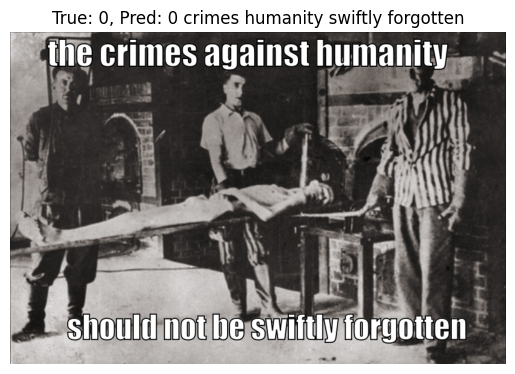

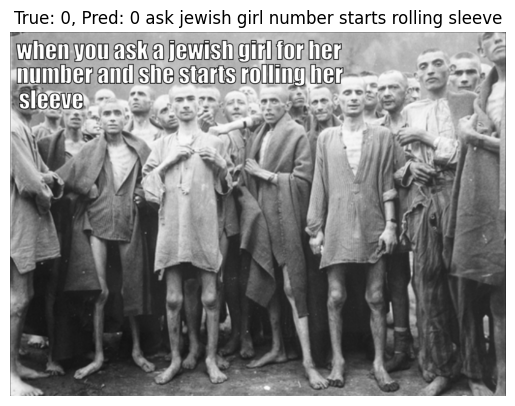

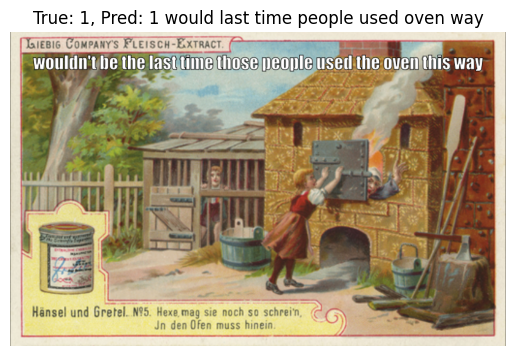

Incorrectly Classified Samples:


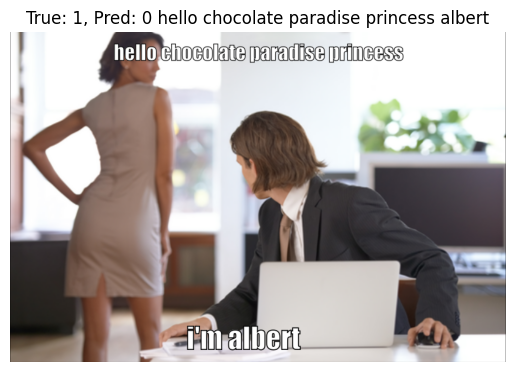

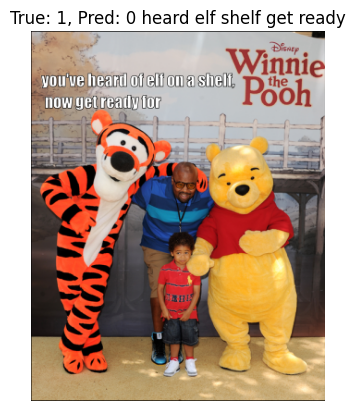

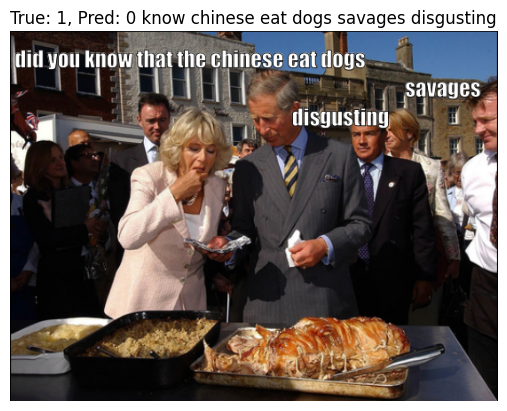

In [75]:
# 5) ResNet + BERT (Early Fusion)
train_early_fusion(data_root, 'train.jsonl', 'dev.jsonl', 'resnet', 'bert', epochs=5, lr=1e-4, batch_size=32)
model_eb = EarlyFusionModel(image_model='resnet', text_model='bert', vocab_size=BertTokenizer.from_pretrained('bert-base-uncased').vocab_size)
model_eb.to(device)
res_eb = evaluate(model_eb, val_loader, device)
print(f"ResNet+BERT Early Fusion -> AUROC: {res_eb['auc']:.4f}, Precision: {res_eb['precision']:.4f}, Recall: {res_eb['recall']:.4f}, F1: {res_eb['f1']:.4f}")
plot_confusion(res_eb['confusion_matrix'])
plot_roc(res_eb['labels'], res_eb['probs'])
analyze_classification(val_loader, res_eb['labels'], res_eb['preds'], val_loader.dataset)

In [ ]:
# 6) ResNet + LSTM (Early Fusion)
train_early_fusion(data_root, 'train.jsonl', 'dev.jsonl', 'resnet', 'lstm', epochs=5, lr=1e-4, batch_size=32)
model_el = EarlyFusionModel(image_model='resnet', text_model='lstm', vocab_size=BertTokenizer.from_pretrained('bert-base-uncased').vocab_size)
model_el.to(device)
res_el = evaluate(model_el, val_loader, device)
print(f"ResNet+LSTM Early Fusion -> AUROC: {res_el['auc']:.4f}, Precision: {res_el['precision']:.4f}, Recall: {res_el['recall']:.4f}, F1: {res_el['f1']:.4f}")
plot_confusion(res_el['confusion_matrix'])
plot_roc(res_el['labels'], res_el['probs'])
analyze_classification(val_loader, res_el['labels'], res_el['preds'], val_loader.dataset)


Starting epoch 1/5
Epoch 1, Batch 10/266, Loss: 0.6192
Epoch 1, Batch 20/266, Loss: 0.7413
Epoch 1, Batch 30/266, Loss: 0.7191
Epoch 1, Batch 40/266, Loss: 0.5907
Epoch 1, Batch 50/266, Loss: 0.7455
Epoch 1, Batch 60/266, Loss: 0.7871
Epoch 1, Batch 70/266, Loss: 0.6050
Epoch 1, Batch 80/266, Loss: 0.7782
Epoch 1, Batch 90/266, Loss: 0.6668
Epoch 1, Batch 100/266, Loss: 0.6119
Epoch 1, Batch 110/266, Loss: 0.6095
Epoch 1, Batch 120/266, Loss: 0.6133
Epoch 1, Batch 130/266, Loss: 0.6780
Epoch 1, Batch 140/266, Loss: 0.5801
Epoch 1, Batch 150/266, Loss: 0.6996
Epoch 1, Batch 160/266, Loss: 0.6230
Epoch 1, Batch 170/266, Loss: 0.5790
Epoch 1, Batch 180/266, Loss: 0.5610
Epoch 1, Batch 190/266, Loss: 0.6883
Epoch 1, Batch 200/266, Loss: 0.5568
Epoch 1, Batch 210/266, Loss: 0.8198
Epoch 1, Batch 220/266, Loss: 0.5634
Epoch 1, Batch 230/266, Loss: 0.6235
Epoch 1, Batch 240/266, Loss: 0.6224
Epoch 1, Batch 250/266, Loss: 0.6301
Epoch 1, Batch 260/266, Loss: 0.6588
Epoch 1, Batch 266/266, Loss

In [ ]:
# 7) CNN + BERT (Early Fusion)
train_early_fusion(data_root, 'train.jsonl', 'dev.jsonl', 'cnn', 'bert', epochs=5, lr=1e-4, batch_size=32)
model_cb_e = EarlyFusionModel(image_model='cnn', text_model='bert', vocab_size=BertTokenizer.from_pretrained('bert-base-uncased').vocab_size)
model_cb_e.to(device)
res_cb_e = evaluate(model_cb_e, val_loader, device)
print(f"CNN+BERT Early Fusion -> AUROC: {res_cb_e['auc']:.4f}, Precision: {res_cb_e['precision']:.4f}, Recall: {res_cb_e['recall']:.4f}, F1: {res_cb_e['f1']:.4f}")
plot_confusion(res_cb_e['confusion_matrix'])
plot_roc(res_cb_e['labels'], res_cb_e['probs'])
analyze_classification(val_loader, res_cb_e['labels'], res_cb_e['preds'], val_loader.dataset)

In [ ]:
# 8) CNN + LSTM (Early Fusion)
train_early_fusion(data_root, 'train.jsonl', 'dev.jsonl', 'cnn', 'lstm', epochs=5, lr=1e-4, batch_size=32)
model_cl_e = EarlyFusionModel(image_model='cnn', text_model='lstm', vocab_size=BertTokenizer.from_pretrained('bert-base-uncased').vocab_size)
model_cl_e.to(device)
res_cl_e = evaluate(model_cl_e, val_loader, device)
print(f"CNN+LSTM Early Fusion -> AUROC: {res_cl_e['auc']:.4f}, Precision: {res_cl_e['precision']:.4f}, Recall: {res_cl_e['recall']:.4f}, F1: {res_cl_e['f1']:.4f}")
plot_confusion(res_cl_e['confusion_matrix'])
plot_roc(res_cl_e['labels'], res_cl_e['probs'])
analyze_classification(val_loader, res_cl_e['labels'], res_cl_e['preds'], val_loader.dataset)
